<a href="https://colab.research.google.com/github/maxrinal/nlp-disaster/blob/master/DiCaro_97582.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Análisis Exploratorio**

Set de datos, competencia de Kaggle. Tweet relacionados con catástrofes.

### **Importo librerías**

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import nltk
import html
import re
import squarify
import urllib

from google.colab import drive
#drive.mount('/content/drive')

### **Opciones de visualización**

In [0]:
pd.options.display.max_columns = 100
pd.options.display.max_rows = 100

plt.style.use('default') #Haciendo los gráficos más bonitos en matplotlib

sns.set(style = 'whitegrid') #Seteando tipo de grid en sns

pd.options.display.float_format = '{:20,.2f}'.format #Suprimimos la notacion científica en los outputs

### **Defino constantes**

In [0]:
ARCHIVO_TRAIN = '/content/drive/My Drive/OrgaDeDatos/Colab Notebooks/train.csv'
LATING_ENCODING = 'latin-1'
UTF_ENCODING = 'utf-8'

### **Importo dataset train de kaggle**

En esta sección analizo su estructura

In [703]:
train = pd.read_csv('https://raw.githubusercontent.com/maxrinal/nlp-disaster/master/train.csv')
train_original = train
train.head()

,id,keyword,location,text,target
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1
2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1
3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1
4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1


In [704]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7613 entries, 0 to 7612
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        7613 non-null   int64 
 1   keyword   7552 non-null   object
 2   location  5080 non-null   object
 3   text      7613 non-null   object
 4   target    7613 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 297.5+ KB


In [705]:
train.keyword.describe()

count           7552
unique           221
top       fatalities
freq              45
Name: keyword, dtype: object

In [706]:
train['keyword'].value_counts().head()

fatalities    45
armageddon    42
deluge        42
damage        41
harm          41
Name: keyword, dtype: int64

In [707]:
train.location.describe()

count     5080
unique    3341
top        USA
freq       104
Name: location, dtype: object

In [708]:
train['location'].value_counts().head()

USA              104
New York          71
United States     50
London            45
Canada            29
Name: location, dtype: int64

In [709]:
train['target'] = train['target'].astype(bool)
train.target.value_counts()

False    4342
True     3271
Name: target, dtype: int64

### **Analizo el porcentaje de verdaderos en "keyword" y "location"**

En algunas keyword los espacios están rempresentados por "%20" (html encoding). En la siguiente instrucción los reemplazo por espacios en blanco.

In [0]:
train['keyword'] = train.keyword.apply(lambda x: urllib.parse.unquote(str(x)))

Calculo la frecuencia de cada keyword y la proporción de verdaderos en cada keyword.

In [711]:
grouped_by_keyword_target = train.groupby(['keyword']).agg({'target' : ['mean', 'count']}) #Al ser target booleana, el mean coincide con el procentage
grouped_by_keyword_target = grouped_by_keyword_target.sort_values(('target', 'mean'), ascending = False)
level0 = grouped_by_keyword_target.columns.get_level_values(0)
level1 = grouped_by_keyword_target.columns.get_level_values(1)
grouped_by_keyword_target.columns = level0 + '_' + level1
grouped_by_keyword_target = grouped_by_keyword_target.reset_index()
grouped_by_keyword_target = grouped_by_keyword_target.rename(columns = {'target_mean' : 'target_coverage_true'})
grouped_by_keyword_target.head()

,keyword,target_coverage_true,target_count
0,wreckage,1.00,39
1,derailment,1.00,39
2,debris,1.00,37
3,outbreak,0.97,40
4,typhoon,0.97,38


In [712]:
#Ordeno por prporción de verdaderos de menor a mayor
grouped_by_keyword_target.sort_values('target_coverage_true', ascending = True).head()

,keyword,target_coverage_true,target_count
221,aftershock,0.00,34
220,body bags,0.02,41
219,ruin,0.03,37
218,blazing,0.03,34
217,body bag,0.03,33


Calculo la frecuencia de cada location y la proporción de verdaderos para cada location.

In [713]:
grouped_by_location = train.groupby(['location']).agg({'target' : ['mean', 'count']}) #Al ser target booleana, el mean coincide con el procentage
grouped_by_location = grouped_by_location.sort_values(('target', 'count'), ascending = False)
level0 = grouped_by_location.columns.get_level_values(0)
level1 = grouped_by_location.columns.get_level_values(1)
grouped_by_location.columns = level0 + '_' + level1
grouped_by_location = grouped_by_location.reset_index()
grouped_by_location = grouped_by_location.rename(columns = {'target_mean' : 'target_coverage_true'})
grouped_by_location.head()

,location,target_coverage_true,target_count
0,USA,0.64,104
1,New York,0.23,71
2,United States,0.54,50
3,London,0.36,45
4,Canada,0.45,29


### **Analizo target y la longitud del tweet**

En el campo text venían links a las fuentes de los tweets. En la instrucción siguiente los elimino y luego calculo la longitud de cada tweet.

In [0]:
train['text'] = train.text.transform(lambda x: re.sub(r'\w+:\/{2}[\d\w-]+(\.[\d\w-]+)*(?:(?:\/[^\s/]*))*', '', str(x)))
train['length_text'] = train.text.transform(lambda x: len(x))

In [715]:
#Algunas medidas estadísticas
train['length_text'].describe()

count               7,613.00
mean                   87.33
std                    32.61
min                     6.00
25%                    62.00
50%                    89.00
75%                   114.00
max                   157.00
Name: length_text, dtype: float64

In [716]:
#Pasamos target a tipo entero para luego poder graficar
train['target'] = train['target'].astype(int)
train.head()

,id,keyword,location,text,target,length_text
0,1,nan,NaN,Our Deeds are the Reason of this #earthquake M...,1,69
1,4,nan,NaN,Forest fire near La Ronge Sask. Canada,1,38
2,5,nan,NaN,All residents asked to 'shelter in place' are ...,1,133
3,6,nan,NaN,"13,000 people receive #wildfires evacuation or...",1,65
4,7,nan,NaN,Just got sent this photo from Ruby #Alaska as ...,1,88


In [0]:
#Calculo cantidad de tweets verdaderos y cantidad de tweets falsos
cantidad_verdaderos = train.loc[train.loc[:, 'target'] == 1, 'target'].count()
cantidad_falsos = train.loc[train.loc[:, 'target'] == 0, 'target'].count()

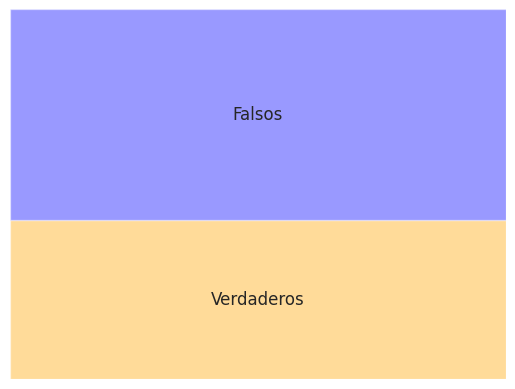

In [718]:
#Grafico treemap de verdaderos y falsos
squarify.plot(sizes = [cantidad_verdaderos,cantidad_falsos], label = ["Verdaderos", "Falsos"], color=["orange","blue"], alpha=.4)
plt.axis('off')
plt.show()

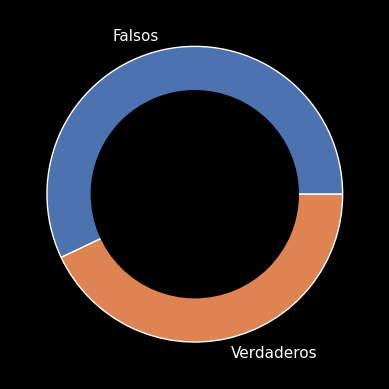

In [719]:
#PieChart proporción de tweets verdaderos y falsos
names = ['Falsos', 'Verdaderos']
size = [cantidad_falsos, cantidad_verdaderos]
 
fig = plt.figure()
fig.patch.set_facecolor('black')

plt.rcParams['text.color'] = 'white'

my_circle = plt.Circle((0,0), 0.7, color = 'black')
 
plt.pie(size, labels = names)
p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()


Text(0, 0.5, 'Verdadero = 1 / Falso = 0')

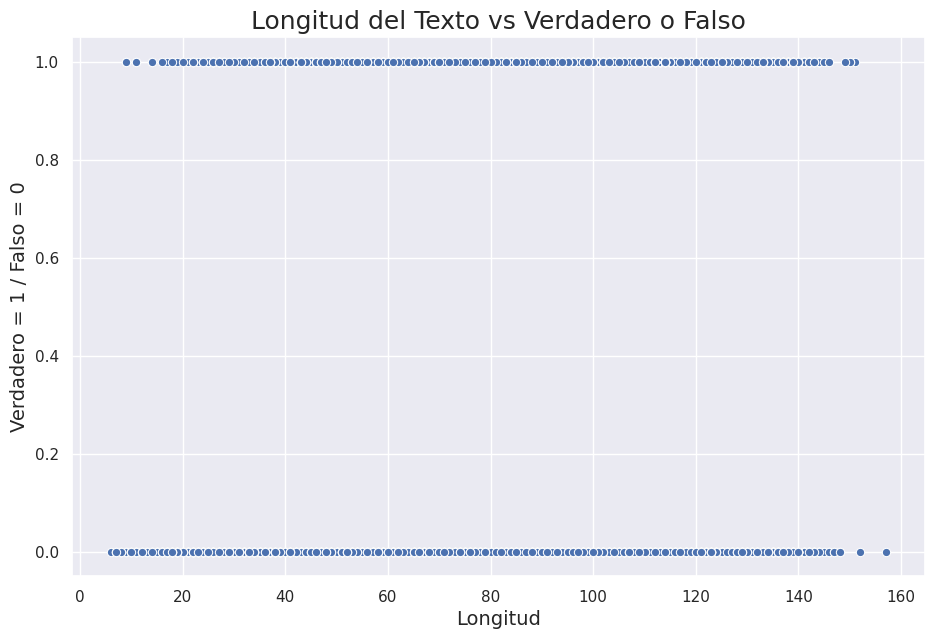

In [720]:
#ScatterPlot longitud del texto vs si es verdadero o no. 
sns.set()
f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'length_text', y = 'target', data = train)

ax.set_title('Longitud del Texto vs Verdadero o Falso', fontsize = 18)
ax.set_xlabel('Longitud', fontsize = 14)
ax.set_ylabel('Verdadero = 1 / Falso = 0', fontsize = 14)

Text(0, 0.5, 'Frecuencia')

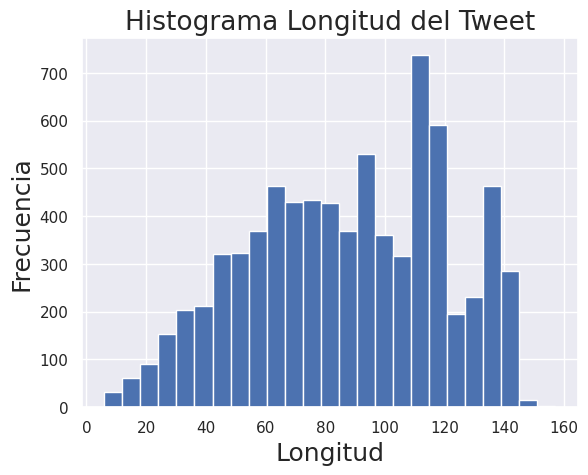

In [721]:
#Histograma de la longitud de los textos
g = train['length_text'].plot.hist(bins = 25)
g.set_title('Histograma Longitud del Tweet', fontsize = 19)
g.set_xlabel('Longitud', fontsize = 18)
g.set_ylabel('Frecuencia', fontsize = 18)

Text(0, 0.5, 'Densidad')

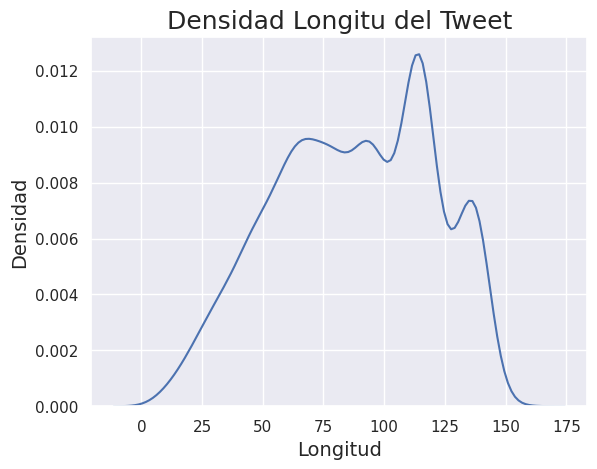

In [722]:
#Densidad de la longitud de los textos
g = sns.distplot(train['length_text'], hist = False)
g.set_title('Densidad Longitu del Tweet', fontsize = 18)
g.set_xlabel('Longitud', fontsize = 14)
g.set_ylabel('Densidad', fontsize = 14)

Text(0.5, 0, 'Densidad')

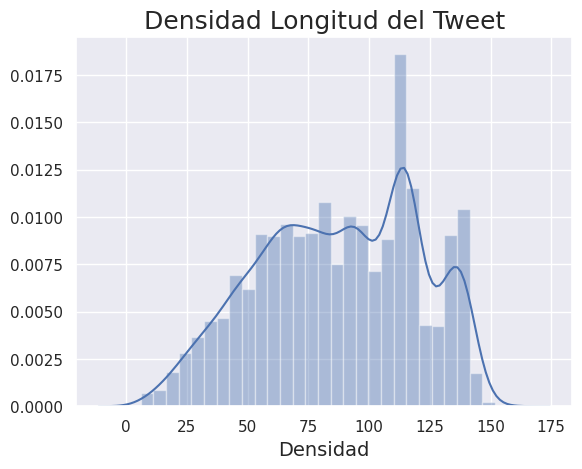

In [723]:
#Histograma con función densidad superpuesto de la longitud de los textos
g = sns.distplot(train['length_text'], hist = True)
g.set_title('Densidad Longitud del Tweet', fontsize = 18)
g.set_xlabel('Longitud', fontsize = 15)
g.set_xlabel('Densidad', fontsize = 14)

Text(0, 0.5, 'Densidad')

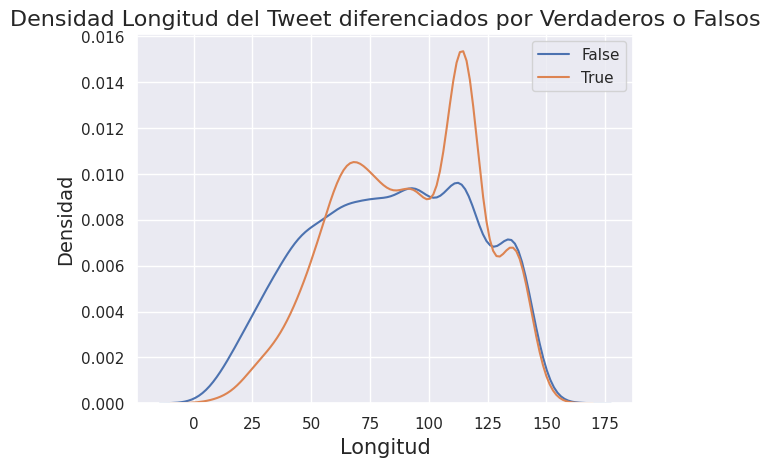

In [724]:
#Densidad de la longitud de los textos diferenciado por verdadero o falso
g = sns.distplot(train.loc[train['target'] == 0, 'length_text'], hist = False, label = 'False')
g = sns.distplot(train.loc[train['target'] == 1, 'length_text'], hist = False, label = 'True')
g.set_title('Densidad Longitud del Tweet diferenciados por Verdaderos o Falsos', fontsize = 16)
g.set_xlabel('Longitud', fontsize = 15)
g.set_ylabel('Densidad', fontsize = 14)

Text(0.5, 1.0, 'Distribución de la Longitud')

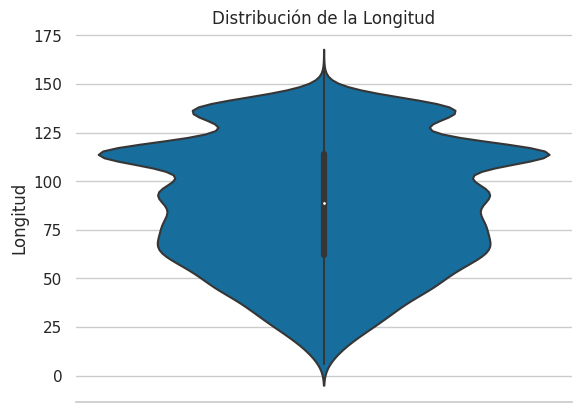

In [725]:
#ViolinPlot de la longitud de los textos
sns.set(style="whitegrid", palette = "colorblind", color_codes=True)

g = sns.violinplot(y = 'length_text', data = train)
sns.despine(left=True)
g.set_ylabel('Longitud')
g.set_title('Distribución de la Longitud')

Text(0.5, 1.0, 'Boxplot Longitud del Texto')

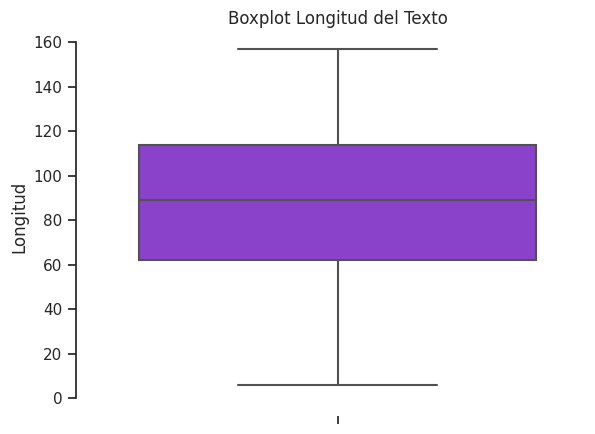

In [726]:
#BoxPlot longitud de los textos
sns.set(style = "ticks", palette = "bright")

g = sns.boxplot(y = "length_text", palette=["m"], data = train)
sns.despine(offset=10, trim=True)
g.set_ylabel('Longitud')
g.set_title('Boxplot Longitud del Texto')

### **Análisis del campo keyword**



In [727]:
#Algunas medidas estadísticas
train.describe()

,id,target,length_text
count,"7,613.00","7,613.00","7,613.00"
mean,"5,441.93",0.43,87.33
std,"3,137.12",0.50,32.61
min,1.00,0.00,6.00
25%,"2,734.00",0.00,62.00
50%,"5,408.00",0.00,89.00
75%,"8,146.00",1.00,114.00
max,"10,873.00",1.00,157.00


Agrupo por keyword, calculo el porcentaje de verdaderos, la cantidad por keyword y la cantidad de verdaderos por keyword

In [728]:
grouped_by_keyword_target['true_count'] = grouped_by_keyword_target.loc[:, 'target_count'] * grouped_by_keyword_target.loc[:, 'target_coverage_true']
grouped_by_keyword_target = grouped_by_keyword_target.sort_values('target_count', ascending = False)
grouped_by_keyword_target.describe()

,target_coverage_true,target_count,true_count
count,222.00,222.00,222.00
mean,0.43,34.29,14.73
std,0.27,5.10,9.85
min,0.00,9.00,0.00
25%,0.18,33.00,6.00
50%,0.38,35.00,13.00
75%,0.67,37.00,22.75
max,1.00,61.00,42.00


In [729]:
#Ordeno segun la proporción de verdaderos de menor a mayor
grouped_by_keyword_target.sort_values('target_coverage_true').head()

,keyword,target_coverage_true,target_count,true_count
221,aftershock,0.00,34,0.00
220,body bags,0.02,41,1.00
219,ruin,0.03,37,1.00
218,blazing,0.03,34,1.00
217,body bag,0.03,33,1.00


Text(0, 0.5, 'Porcentaje de Verdaderos')

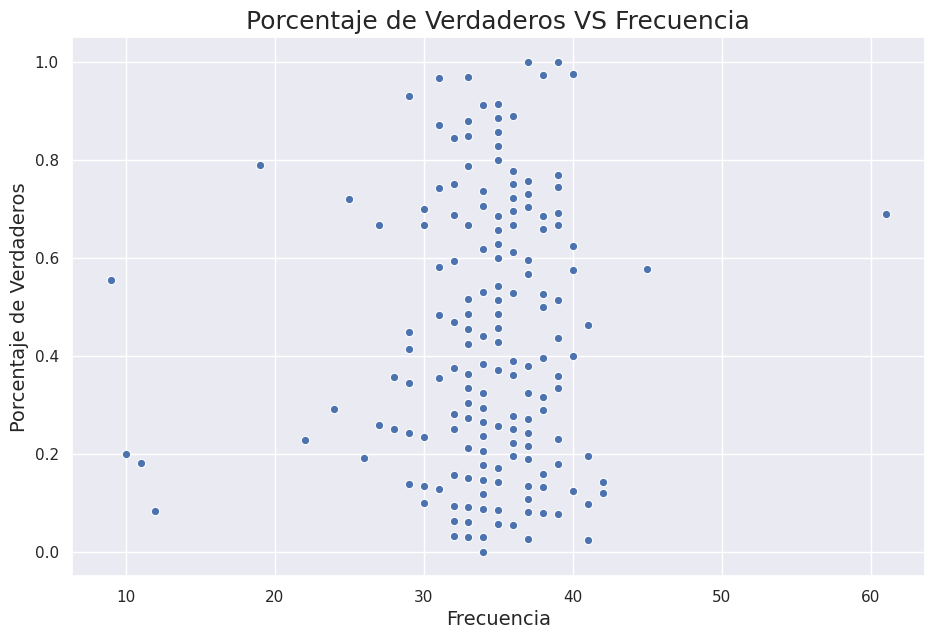

In [730]:
#ScatterPlot proporción de verdaderos vs frecuencia
sns.set()
f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'target_count', y = 'target_coverage_true', data = grouped_by_keyword_target)

ax.set_title('Porcentaje de Verdaderos VS Frecuencia', fontsize = 18)
ax.set_xlabel('Frecuencia', fontsize = 14)
ax.set_ylabel('Porcentaje de Verdaderos', fontsize = 14)

Text(0.5, 1.0, 'Boxplot Apariciones Keyword')

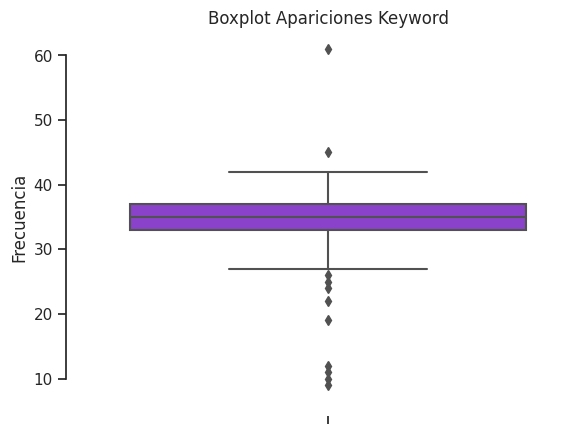

In [731]:
#Boxplot cantidad de apariciones de las keyword
sns.set(style = "ticks", palette = 'bright')

g = sns.boxplot(y = "target_count", palette=["m"], data = grouped_by_keyword_target)
sns.despine(offset=10, trim=True)
g.set_ylabel('Frecuencia')
g.set_title('Boxplot Apariciones Keyword')

In [732]:
#Top 5 keyword con mas frecuencia
train.keyword.value_counts().head()

nan           61
fatalities    45
deluge        42
armageddon    42
damage        41
Name: keyword, dtype: int64

Text(0, 0.5, 'Fecuencia')

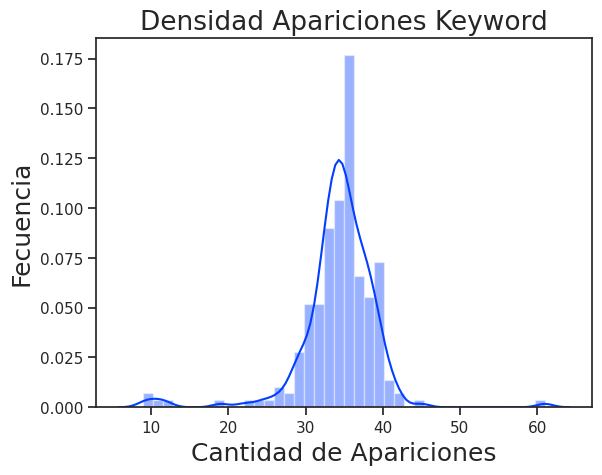

In [733]:
#Densidad de la cantidad de apariciones por keyword
g = sns.distplot(train.keyword.value_counts(), hist = True)
g.set_title('Densidad Apariciones Keyword', fontsize = 19)
g.set_xlabel('Cantidad de Apariciones', fontsize = 18)
g.set_ylabel('Fecuencia', fontsize = 18)

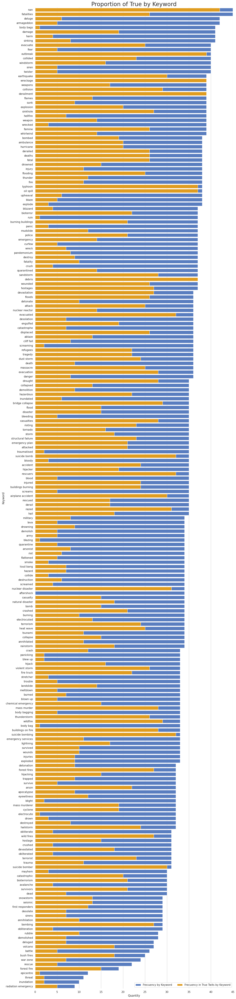

In [734]:
#Proporción de verdaderos por keyword total
sns.set(style = 'whitegrid')
f, ax = plt.subplots(figsize = (15, 75))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target,\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target, label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 24)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45), ylabel = 'Keyword', xlabel = 'Quantity')

sns.despine(left = True, bottom = True)


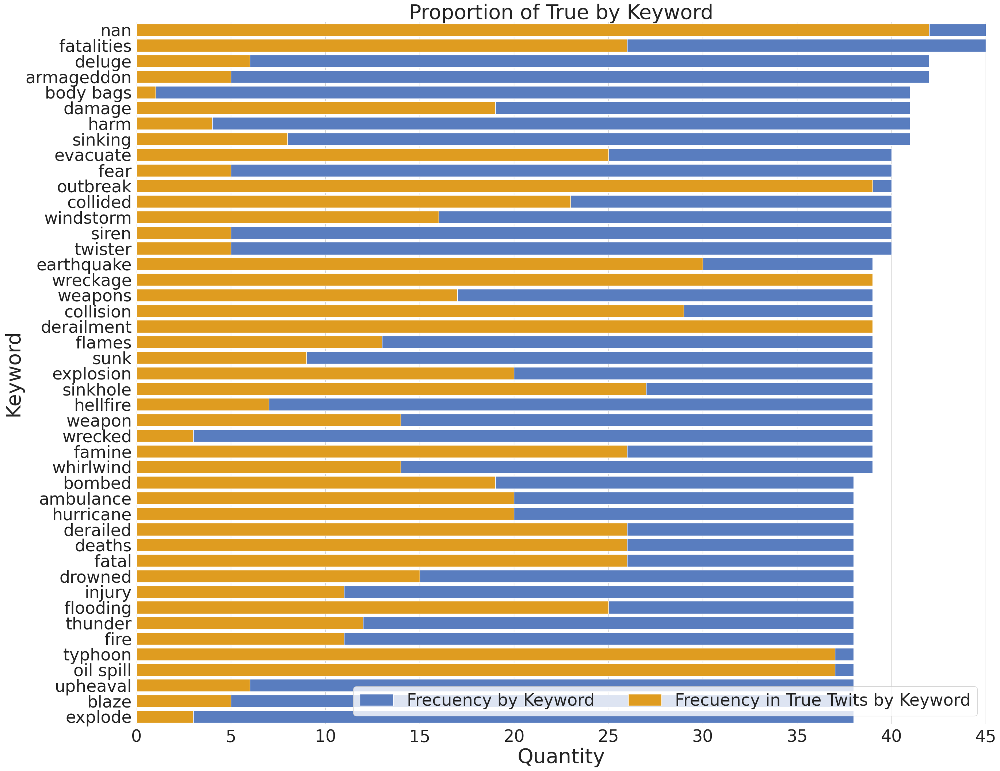

In [735]:
#Proporción de verdaderos por keyword, primeros 45 ordenados de menor a mayor
sns.set(style = 'whitegrid', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 25))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target.iloc[0:45, :],\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target.iloc[0:45, :], label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 40)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45))
ax.set_ylabel('Keyword', fontsize = 40)
ax.set_xlabel('Quantity', fontsize = 40)

sns.despine(left = True, bottom = True)

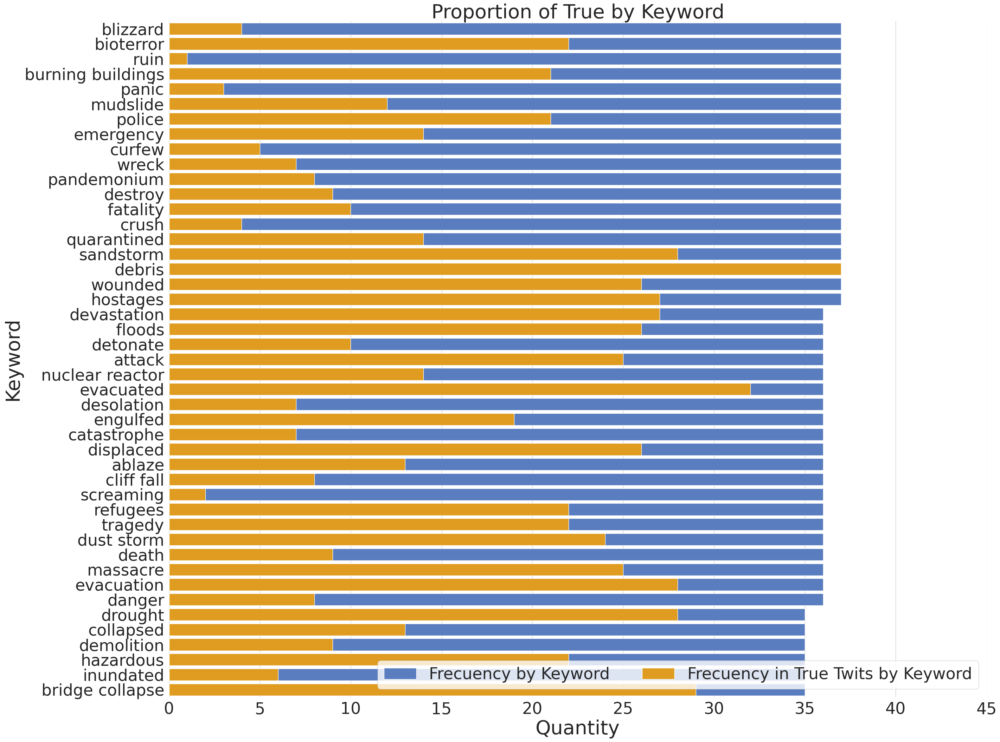

In [736]:
#Proporción de verdaderos por keyword, del 45 al 90 ordenados de menor a mayor
sns.set(style = 'whitegrid', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 25))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target.iloc[45:90, :],\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target.iloc[45:90, :], label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 40)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45))
ax.set_ylabel('Keyword', fontsize = 40)
ax.set_xlabel('Quantity', fontsize = 40)

sns.despine(left = True, bottom = True)

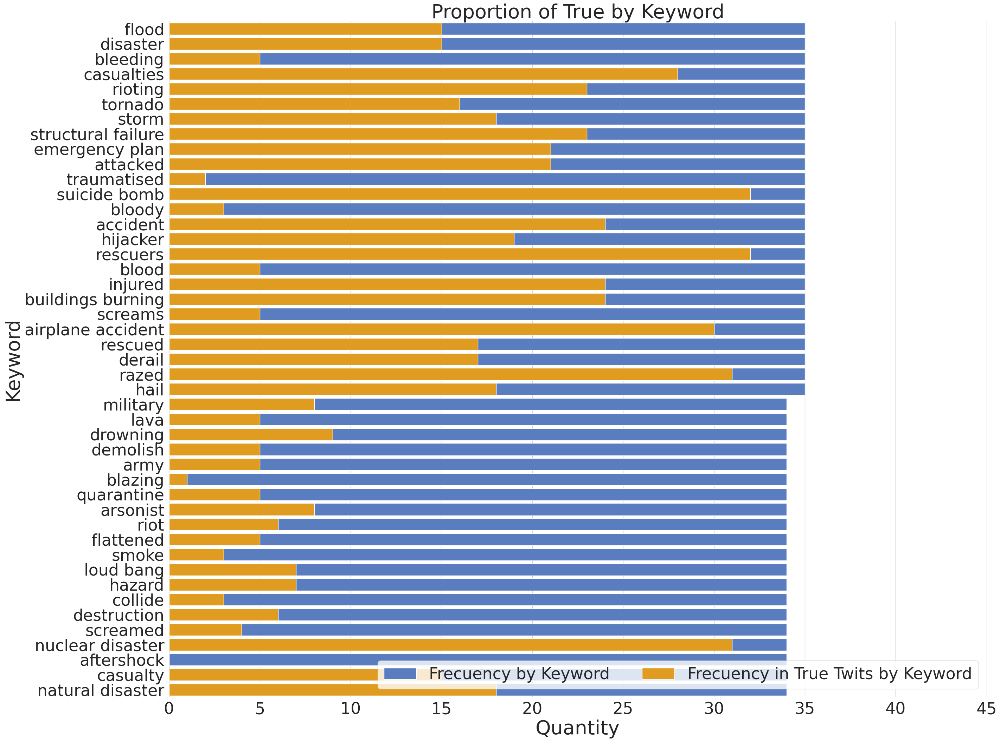

In [737]:
#Proporción de verdaderos por keyword, del 90 al 135 ordenados de menor a mayor
sns.set(style = 'whitegrid', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 25))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target.iloc[90:135, :],\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target.iloc[90:135, :], label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 40)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45))
ax.set_ylabel('Keyword', fontsize = 40)
ax.set_xlabel('Quantity', fontsize = 40)

sns.despine(left = True, bottom = True)

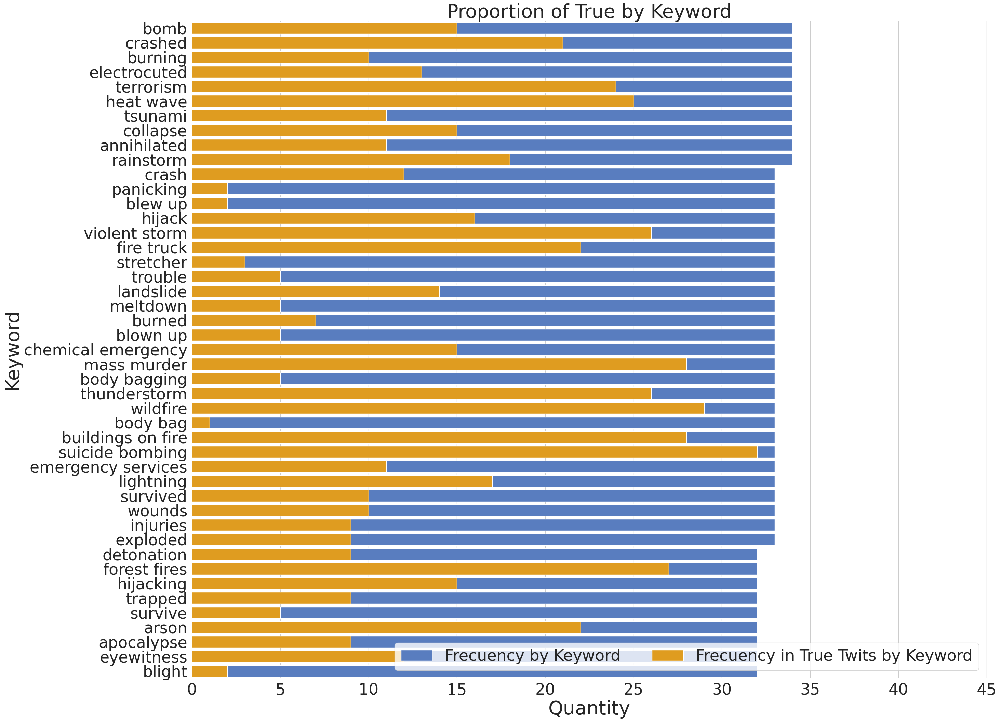

In [738]:
#Proporción de verdaderos por keyword, del 135 al 180 ordenados de menor a mayor
sns.set(style = 'whitegrid', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 25))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target.iloc[135:180, :],\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target.iloc[135:180, :], label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 40)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45))
ax.set_ylabel('Keyword', fontsize = 40)
ax.set_xlabel('Quantity', fontsize = 40)

sns.despine(left = True, bottom = True)

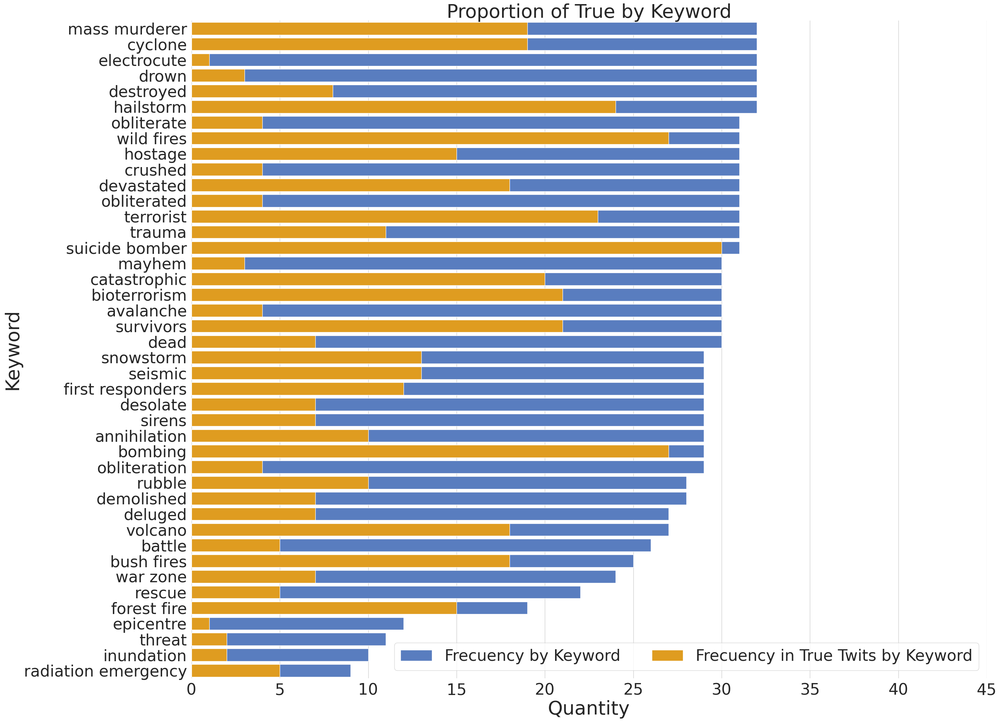

In [739]:
#Proporción de verdaderos por keyword, del 180 en adelante ordenados de menor a mayor. Barplot
sns.set(style = 'whitegrid', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 25))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target.iloc[180:, :],\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target.iloc[180:, :], label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 40)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45))
ax.set_ylabel('Keyword', fontsize = 40)
ax.set_xlabel('Quantity', fontsize = 40)

sns.despine(left = True, bottom = True)

In [740]:
#Agrupo por keyword, calculo longitud media, el desvío estándar, y la cantidad por keyword
grouped_by_keyword_length = train.groupby(['keyword']).agg({'length_text' : ['mean', 'std', 'count']})
grouped_by_keyword_length = grouped_by_keyword_length.sort_values(('length_text', 'count'), ascending = False)
level0 = grouped_by_keyword_length.columns.get_level_values(0)
level1 = grouped_by_keyword_length.columns.get_level_values(1)
grouped_by_keyword_length.columns = level0 + '_' + level1
grouped_by_keyword_length = grouped_by_keyword_length.reset_index()
grouped_by_keyword_length.head()

,keyword,length_text_mean,length_text_std,length_text_count
0,nan,65.25,39.70,61
1,fatalities,90.89,29.79,45
2,deluge,100.57,30.46,42
3,armageddon,91.40,31.94,42
4,body bags,83.05,32.81,41


In [0]:
#Agrego la información anterior al dataset completo train
train = train.merge(grouped_by_keyword_length)
train = train.rename(columns = {'length_text_mean' : 'length_text_mean_by_keyword', 'length_text_std' : 'length_text_std_by_keyword', 'length_text_count' : 'length_text_count_by_keyword'})

In [0]:
#Renombro la columna "length_text_count_by_keyword".
train = train.rename(columns = {'length_text_count_by_keyword' : 'keyword_counts'})

In [0]:
#oredeno train por cantidad de keyword y keyword de mayor a menor
train = train.sort_values(['keyword_counts', 'keyword'], ascending = False)

In [0]:
#Agrego a train una columna que indique de manera categórica si el tweet es verdadero o falso.
train['target_categorico'] = train.target.astype(bool)

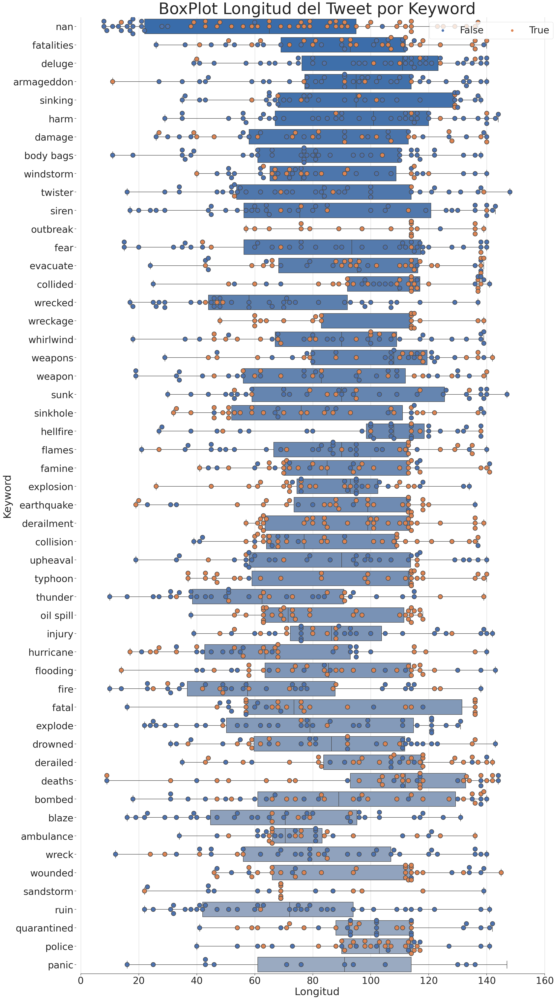

In [745]:
#BoxPlot de la longitud del texto por cada keyword. Primeras 2023 filas. Uso Seaborn
sns.set(style = 'ticks', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 60))

sns.set_color_codes('pastel')
sns.boxplot(x = 'length_text', y = 'keyword', data = train, whis = [0, 100], palette = 'vlag')

sns.set_color_codes('bright')
sns.swarmplot(x = 'length_text', y = 'keyword', hue = 'target_categorico', data = train.iloc[:2023, :], size = 15, linewidth = 2)

ax.set_title('BoxPlot Longitud del Tweet por Keyword', fontsize = 55)
ax.xaxis.grid(True)
ax.set(ylabel = 'Keyword', xlabel = 'Longitud')
ax.legend(ncol = 2, loc = 'upper right', frameon = True)
sns.despine(trim = True, left = True)

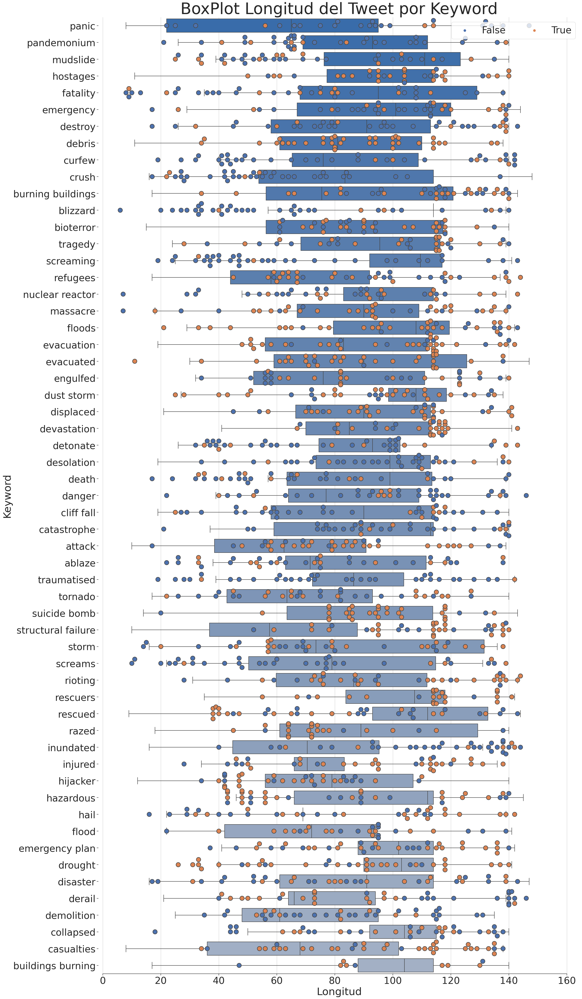

In [746]:
#BoxPlot de la longitud del texto por cada keyword. De la fila 2023 a la 2024. Uso Seaborn
sns.set(style = 'ticks', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 60))

sns.set_color_codes('pastel')
sns.boxplot(x = 'length_text', y = 'keyword', data = train, whis = [0, 100], palette = 'vlag')

sns.set_color_codes('bright')
sns.swarmplot(x = 'length_text', y = 'keyword', hue = 'target_categorico', data = train.iloc[2023:4025, :], size = 15, linewidth = 2)

ax.set_title('BoxPlot Longitud del Tweet por Keyword', fontsize = 55)
ax.xaxis.grid(True)
ax.set(ylabel = 'Keyword', xlabel = 'Longitud')
ax.legend(ncol = 2, loc = 'upper right', frameon = True)
sns.despine(trim = True, left = True)

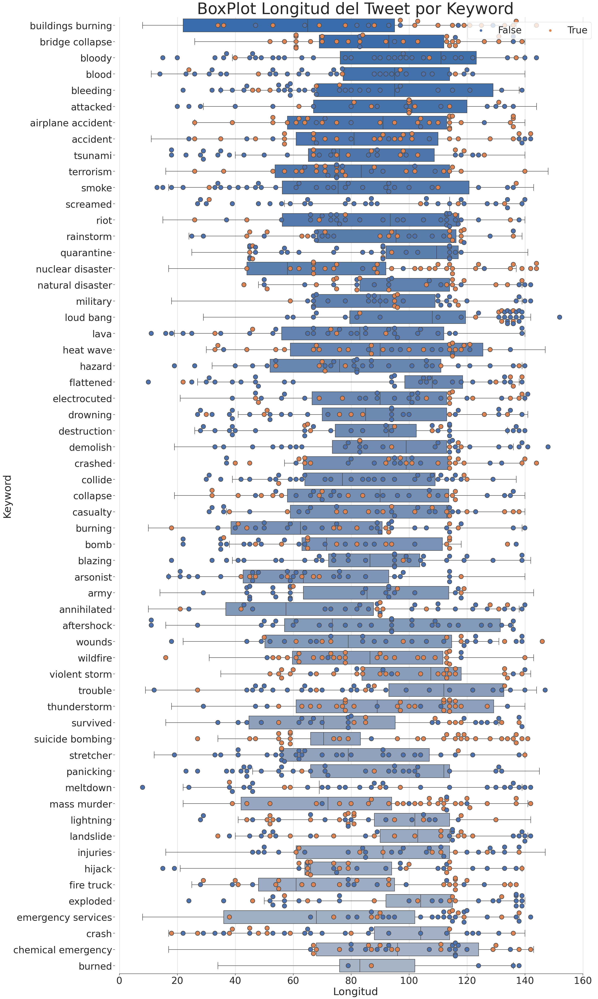

In [747]:
#BoxPlot de la longitud del texto por cada keyword. De la fila 4025 a la 5981. Uso Seaborn
sns.set(style = 'ticks', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 60))

sns.set_color_codes('pastel')
sns.boxplot(x = 'length_text', y = 'keyword', data = train, whis = [0, 100], palette = 'vlag')

sns.set_color_codes('bright')
sns.swarmplot(x = 'length_text', y = 'keyword', hue = 'target_categorico', data = train.iloc[4025:5981, :], size = 15, linewidth = 2)

ax.set_title('BoxPlot Longitud del Tweet por Keyword', fontsize = 55)
ax.xaxis.grid(True)
ax.set(ylabel = 'Keyword', xlabel = 'Longitud')
ax.legend(ncol = 2, loc = 'upper right', frameon = True)
sns.despine(trim = True, left = True)

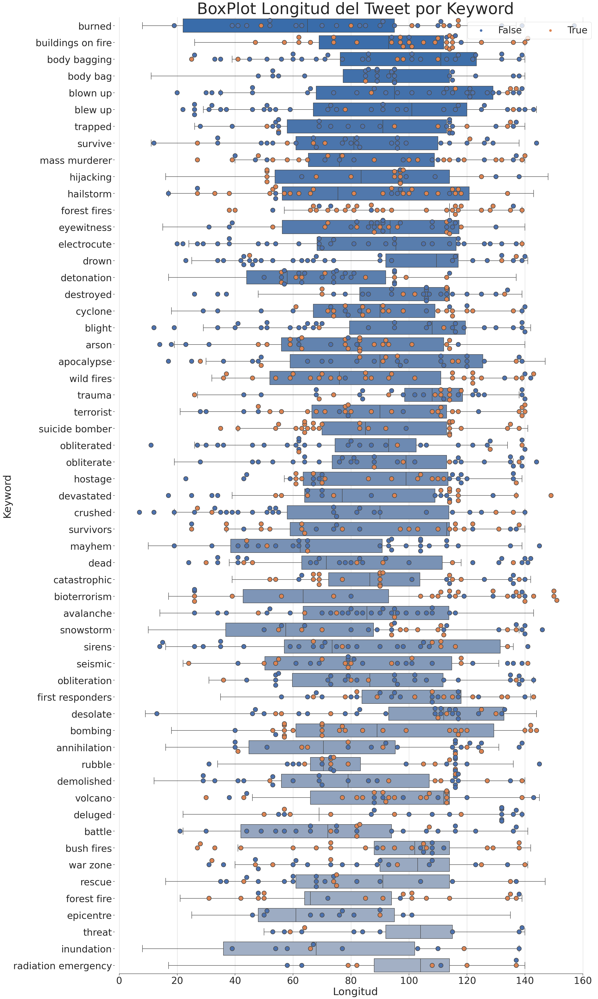

In [748]:
#BoxPlot de la longitud del texto por cada keyword. De la fila 5981 en adelante. Uso Seaborn
sns.set(style = 'ticks', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 60))

sns.set_color_codes('pastel')
sns.boxplot(x = 'length_text', y = 'keyword', data = train, whis = [0, 100], palette = 'vlag')

sns.set_color_codes('bright')
sns.swarmplot(x = 'length_text', y = 'keyword', hue = 'target_categorico', data = train.iloc[5981:, :], size = 15, linewidth = 2)

ax.set_title('BoxPlot Longitud del Tweet por Keyword', fontsize = 55)
ax.xaxis.grid(True)
ax.set(ylabel = 'Keyword', xlabel = 'Longitud')
ax.legend(ncol = 2, loc = 'upper right', frameon = True)
sns.despine(trim = True, left = True)

Agrupo por keyword, calculo longitud media y desvio estandar de los textos, cantidad de apariciones, porcentaje de verdaderos y cantidad de verdaderos

In [749]:
grouped_by_keyword = grouped_by_keyword_length.merge(grouped_by_keyword_target, left_on = 'keyword', right_on = 'keyword', how = 'outer')
grouped_by_keyword.drop(columns = 'target_count', inplace = True)
grouped_by_keyword.head()

,keyword,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count
0,nan,65.25,39.70,61,0.69,42.00
1,fatalities,90.89,29.79,45,0.58,26.00
2,deluge,100.57,30.46,42,0.14,6.00
3,armageddon,91.40,31.94,42,0.12,5.00
4,body bags,83.05,32.81,41,0.02,1.00


Calculo por keyword la longitud media de los tweets verdaderos

In [750]:
grouped_by_keyword_target_length_mean_true = train.loc[train.loc[:, 'target'] == True].groupby(['keyword']).agg({'length_text' : 'mean'})
grouped_by_keyword_target_length_mean_true = grouped_by_keyword_target_length_mean_true.reset_index()
grouped_by_keyword_target_length_mean_true = grouped_by_keyword_target_length_mean_true.rename(columns = {'length_text' : 'length_text_mean_true'})
grouped_by_keyword_target_length_mean_true.head()

,keyword,length_text_mean_true
0,ablaze,74.62
1,accident,87.29
2,airplane accident,93.63
3,ambulance,78.70
4,annihilated,92.00


Calculo por keyword la longitud media de los tweets falsos

In [751]:
grouped_by_keyword_target_length_mean_false = train.loc[train.loc[:, 'target'] == False].groupby(['keyword']).agg({'length_text' : 'mean'})
grouped_by_keyword_target_length_mean_false = grouped_by_keyword_target_length_mean_false.reset_index()
grouped_by_keyword_target_length_mean_false = grouped_by_keyword_target_length_mean_false.rename(columns = {'length_text' : 'length_text_mean_false'})
grouped_by_keyword_target_length_mean_false.head()

,keyword,length_text_mean_false
0,ablaze,75.30
1,accident,93.45
2,aftershock,87.53
3,airplane accident,89.80
4,ambulance,76.39


Hago un merge de la longitud media de verdaderos y falsos por keyword

In [0]:
grouped_by_keyword_target_length_mean = grouped_by_keyword_target_length_mean_true.merge(grouped_by_keyword_target_length_mean_false, left_on = 'keyword', right_on = 'keyword', how = 'outer')
grouped_by_keyword_target_length_mean = grouped_by_keyword_target_length_mean.merge(grouped_by_keyword)

In [753]:
#Calculo el desvío estándar de los tweets verdaderos
grouped_by_keyword_length_std_true = train.loc[train.loc[:, 'target_categorico'] == True, :].groupby(['keyword']).agg({'length_text' : 'std'})
grouped_by_keyword_length_std_true.tail()

,length_text
keyword,
wounded,27.91
wounds,32.72
wreck,23.93
wreckage,23.17
wrecked,3.06


In [754]:
#DataFrame con las keyword que tienen mayor longitud media de verdaderos que falsos
grouped_by_keyword_target_length_mean.loc[grouped_by_keyword_target_length_mean['length_text_mean_true'] >\
                                          grouped_by_keyword_target_length_mean['length_text_mean_false'], :].tail(5)

,keyword,length_text_mean_true,length_text_mean_false,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count
208,volcano,93.50,91.11,92.70,27.86,27,0.67,18.00
209,war zone,80.86,77.88,78.75,32.40,24,0.29,7.00
210,weapon,92.71,79.04,83.95,35.33,39,0.36,14.00
211,weapons,101.65,98.82,100.05,28.95,39,0.44,17.00
217,wounds,98.00,92.26,94.00,33.51,33,0.30,10.00


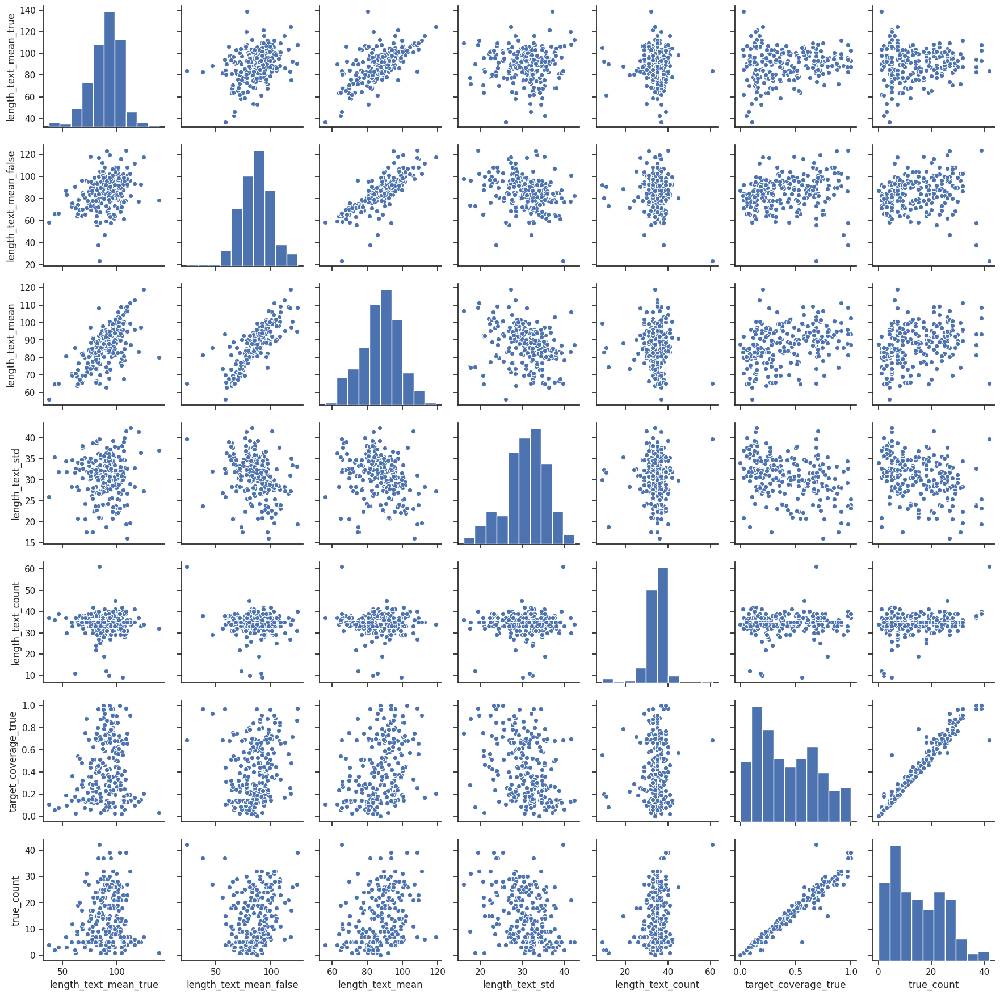

In [755]:
#Pairplot del dataframe anterior
sns.set(style="ticks")
sns.pairplot(grouped_by_keyword_target_length_mean)

Text(0, 0.5, 'Longitud Media Total por Keyword')

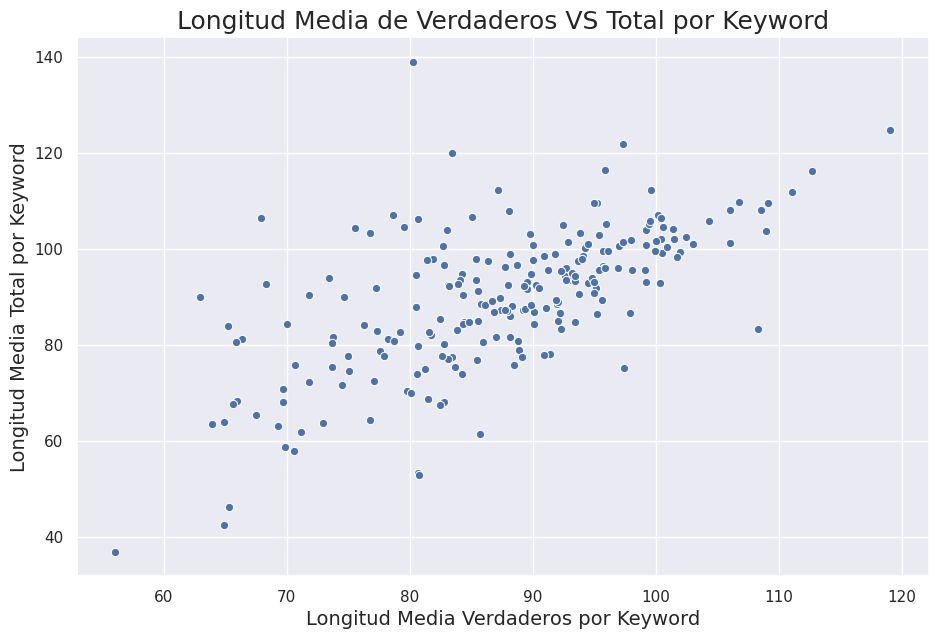

In [756]:
#Longitud media de verdaderos vs la longitud total del keyword. ScatterPlot. Seaborn
sns.set()
f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'length_text_mean', y = 'length_text_mean_true', data = grouped_by_keyword_target_length_mean)

ax.set_title('Longitud Media de Verdaderos VS Total por Keyword', fontsize = 18)
ax.set_xlabel('Longitud Media Verdaderos por Keyword', fontsize = 14)
ax.set_ylabel('Longitud Media Total por Keyword', fontsize = 14)

Text(0.5, 1.0, 'Longitud Media por Keyword')

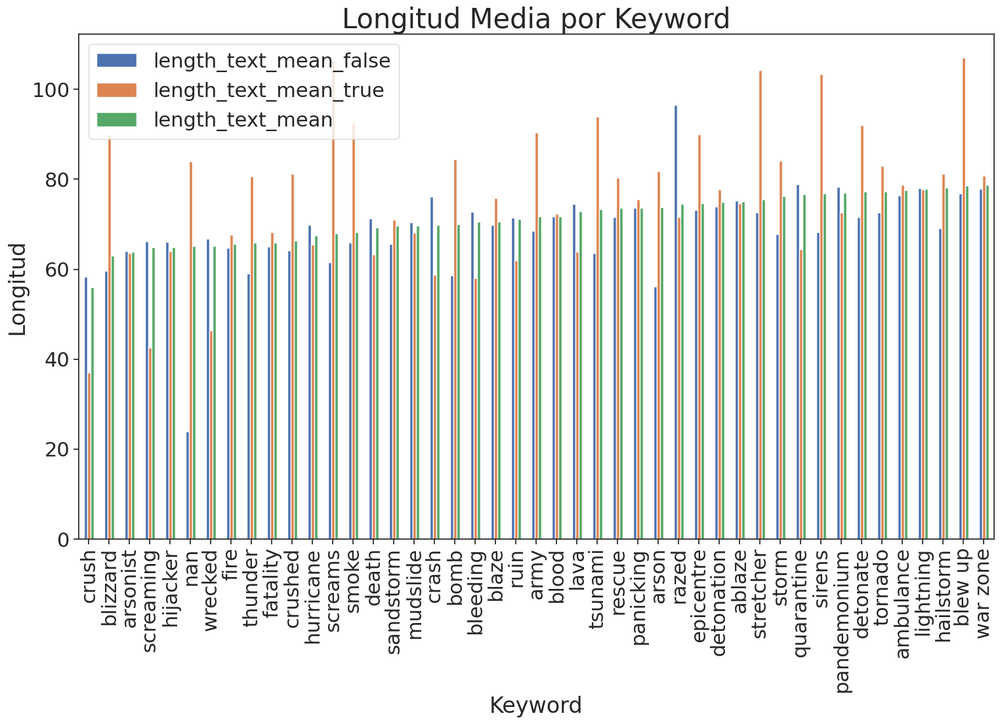

In [757]:
#Longitud media por keyword. Barplot. Primeras 45 keyword ordenas segun su longitud media
sns.set(style = 'ticks', font_scale = 2)
g = grouped_by_keyword_target_length_mean.sort_values('length_text_mean').iloc[:45, :].plot.bar(x = 'keyword', y = ['length_text_mean_false','length_text_mean_true', 'length_text_mean'], figsize=(18,10))
g.set_ylabel('Longitud', fontsize = 24)
g.set_xlabel('Keyword', fontsize = 24)
g.set_title('Longitud Media por Keyword', fontsize = 30)

Text(0.5, 1.0, 'Longitud Media por Keyword')

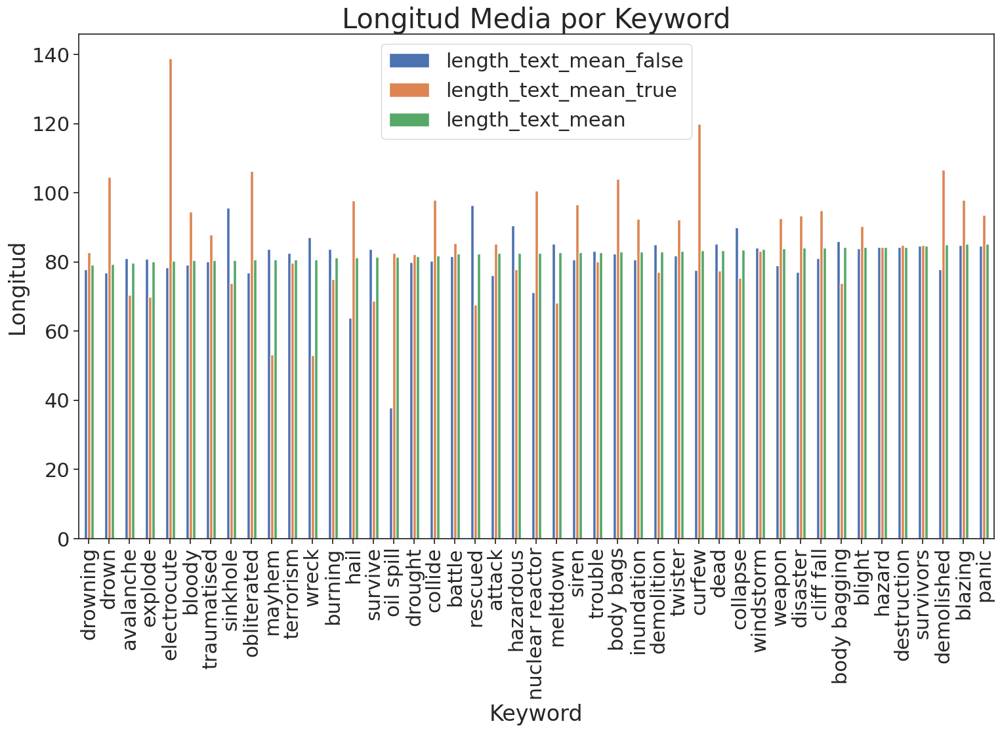

In [758]:
#Longitud media por keyword. Barplot Seaborn. keyword 45 a la 90 ordenas segun su longitud media.
sns.set(style = 'ticks', font_scale = 2)
g = grouped_by_keyword_target_length_mean.sort_values('length_text_mean').iloc[45:90, :].plot.bar(x = 'keyword', y = ['length_text_mean_false','length_text_mean_true', 'length_text_mean'], figsize=(18,10))
g.set_ylabel('Longitud', fontsize = 24)
g.set_xlabel('Keyword', fontsize = 24)
g.set_title('Longitud Media por Keyword', fontsize = 30)

Text(0.5, 1.0, 'Longitud Media por Keyword')

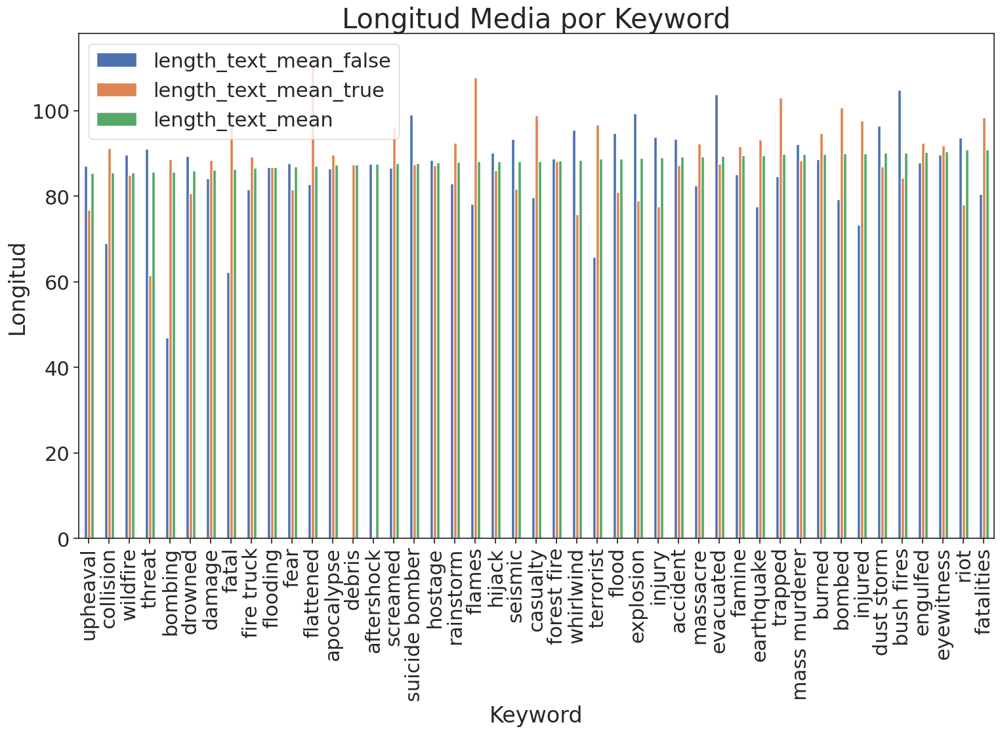

In [759]:
#Longitud media por keyword. Barplot Seaborn. keyword 90 a la 134 ordenas segun su longitud media.
sns.set(style = 'ticks', font_scale = 2)
g = grouped_by_keyword_target_length_mean.sort_values('length_text_mean').iloc[90:135, :].plot.bar(x = 'keyword', y = ['length_text_mean_false','length_text_mean_true', 'length_text_mean'], figsize=(18,10))
g.set_ylabel('Longitud', fontsize = 24)
g.set_xlabel('Keyword', fontsize = 24)
g.set_title('Longitud Media por Keyword', fontsize = 30)

Text(0.5, 1.0, 'Longitud Media por Keyword')

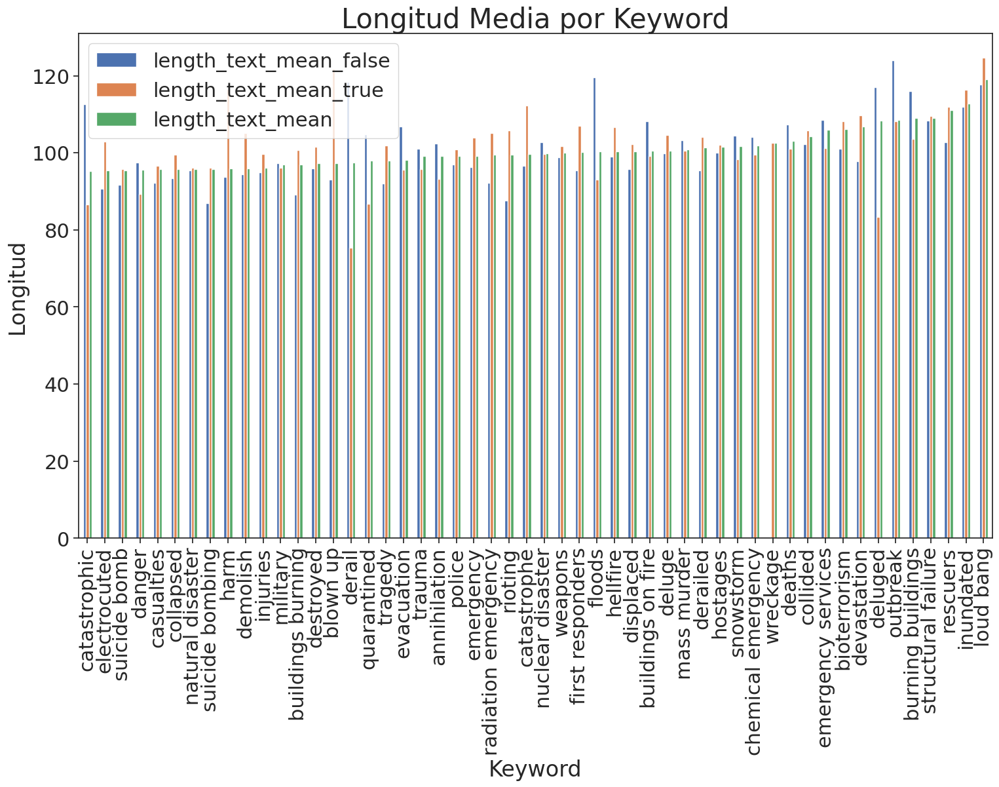

In [760]:
#Longitud media diferencia de por total, verdaderos y falsos por keyword. Barplot Seaborn. keyword 90 a la 134 ordenas segun su longitud media.
sns.set(style = 'ticks', font_scale = 2)
g = grouped_by_keyword_target_length_mean.sort_values('length_text_mean').iloc[170:, :].plot.bar(x = 'keyword', y = ['length_text_mean_false','length_text_mean_true', 'length_text_mean'], figsize=(18,10))
g.set_ylabel('Longitud', fontsize = 24)
g.set_xlabel('Keyword', fontsize = 24)
g.set_title('Longitud Media por Keyword', fontsize = 30)

Text(0, 0.5, '%/100')

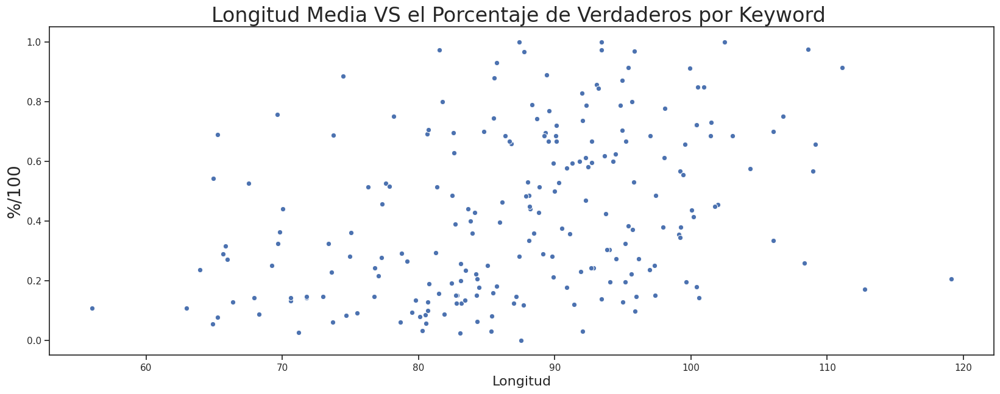

In [761]:
#Longitud media vs el porcentaje de verdaderos por keyword. ScatterPlot Seaborn
sns.set(style = 'ticks', font_scale = 1)
f, ax = plt.subplots(figsize = (20, 7))

sns.scatterplot(x = 'length_text_mean', y = 'target_coverage_true', data = grouped_by_keyword)

ax.set_title('Longitud Media VS el Porcentaje de Verdaderos por Keyword ', fontsize = 24)
ax.set_xlabel('Longitud', fontsize = 16)
ax.set_ylabel('%/100', fontsize = 20)

Realizo una transformación a la longitud media. Lo elevo a cuadarado y al cubo para ver si se linealiza

In [762]:
grouped_by_keyword['sqr(length_text_mean)'] = grouped_by_keyword.loc[:, 'length_text_mean'] * grouped_by_keyword.loc[:, 'length_text_mean']
grouped_by_keyword['length_text_mean^3'] = grouped_by_keyword.loc[:, 'sqr(length_text_mean)'] * grouped_by_keyword.loc[:, 'length_text_mean']
grouped_by_keyword.head()

,keyword,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count,sqr(length_text_mean),length_text_mean^3
0,nan,65.25,39.70,61,0.69,42.00,"4,257.03","277,753.61"
1,fatalities,90.89,29.79,45,0.58,26.00,"8,260.79","750,814.04"
2,deluge,100.57,30.46,42,0.14,6.00,"10,114.61","1,017,241.00"
3,armageddon,91.40,31.94,42,0.12,5.00,"8,354.83","763,671.29"
4,body bags,83.05,32.81,41,0.02,1.00,"6,897.10","572,795.74"


Text(0, 0.5, 'Coverage True')

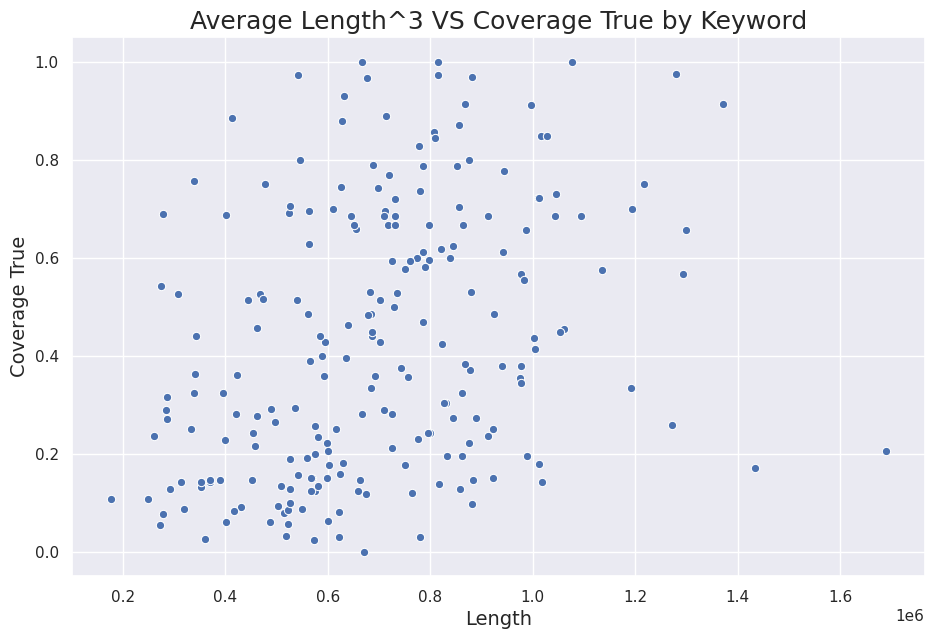

In [763]:
##Longitud media al cubo vs el porcentaje de verdaderos por keyword. ScatterPlot Seaborn
sns.set()
f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'length_text_mean^3', y = 'target_coverage_true', data = grouped_by_keyword)

ax.set_title('Average Length^3 VS Coverage True by Keyword', fontsize = 18)
ax.set_xlabel('Length', fontsize = 14)
ax.set_ylabel('Coverage True', fontsize = 14)

Calculo la longitud de cada keyword

In [764]:
def len_keyword (x):
  return len(x)

grouped_by_keyword['length_keyword'] = grouped_by_keyword.loc[:, 'keyword'].transform(len_keyword)
grouped_by_keyword.head()

,keyword,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count,sqr(length_text_mean),length_text_mean^3,length_keyword
0,nan,65.25,39.70,61,0.69,42.00,"4,257.03","277,753.61",3
1,fatalities,90.89,29.79,45,0.58,26.00,"8,260.79","750,814.04",10
2,deluge,100.57,30.46,42,0.14,6.00,"10,114.61","1,017,241.00",6
3,armageddon,91.40,31.94,42,0.12,5.00,"8,354.83","763,671.29",10
4,body bags,83.05,32.81,41,0.02,1.00,"6,897.10","572,795.74",9


Text(0, 0.5, '%/100')

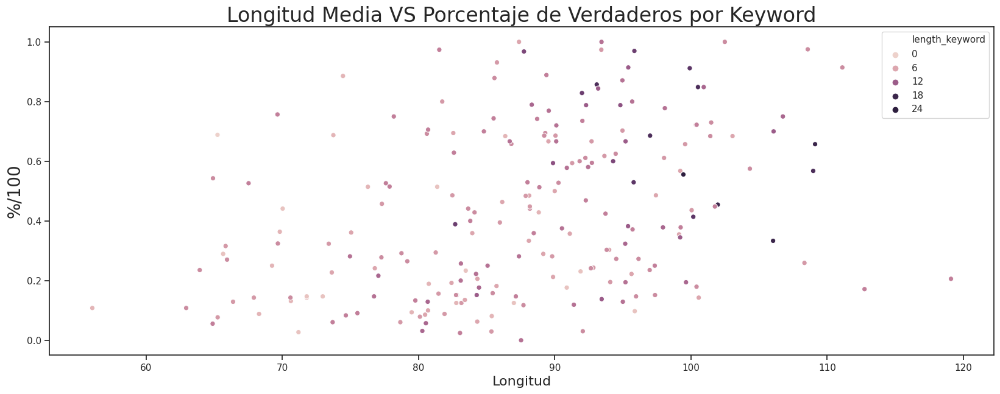

In [765]:
#ScatterPlot longitud media vs porcentaje de verdaderos por keyword. Seaborn
sns.set(style = 'ticks', font_scale = 1)
f, ax = plt.subplots(figsize = (20, 7))

sns.scatterplot(x = 'length_text_mean', y = 'target_coverage_true', hue = 'length_keyword', data = grouped_by_keyword)

ax.set_title('Longitud Media VS Porcentaje de Verdaderos por Keyword', fontsize = 24)
ax.set_xlabel('Longitud', fontsize = 16)
ax.set_ylabel('%/100', fontsize = 20)

In [766]:
#Me quedo con las keyword con una longitud mayor a 12 
grouped_by_keyword.loc[grouped_by_keyword.loc[:, 'length_keyword'] > 12, :].head()

,keyword,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count,sqr(length_text_mean),length_text_mean^3,length_keyword
51,burning buildings,108.97,26.76,37,0.57,21.00,"11,875.11","1,294,065.91",17
72,nuclear reactor,82.69,31.13,36,0.39,14.00,"6,838.37","565,495.30",15
84,bridge collapse,92.00,27.69,35,0.83,29.00,"8,464.00","778,688.00",15
86,airplane accident,93.09,30.20,35,0.86,30.00,"8,664.95","806,583.08",17
96,structural failure,109.11,23.98,35,0.66,23.00,"11,905.93","1,299,106.76",18


Text(0, 0.5, '%/100')

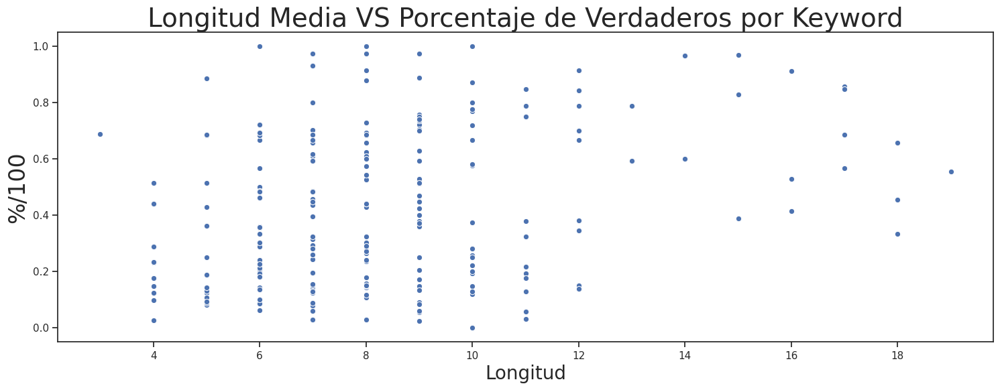

In [767]:
#ScatterPlot longitud media vs porcentaje de verdaderos por keyword. Seaborn
sns.set(style="ticks")

f, ax = plt.subplots(figsize = (18, 6))

sns.scatterplot(x = 'length_keyword', y = 'target_coverage_true', data = grouped_by_keyword)

ax.set_title('Longitud Media VS Porcentaje de Verdaderos por Keyword', fontsize = 28)
ax.set_xlabel('Longitud', fontsize = 20)
ax.set_ylabel('%/100', fontsize = 24)

In [768]:
#Calculo cantidad de palabras por texto
train['quantity_words'] = train.loc[:, 'text'].transform(func = lambda x: len(x.split()))
train.head()

,id,keyword,location,text,target,length_text,length_text_mean_by_keyword,length_text_std_by_keyword,keyword_counts,target_categorico,quantity_words
0,1,nan,NaN,Our Deeds are the Reason of this #earthquake M...,1,69,65.25,39.70,61,True,13
1,4,nan,NaN,Forest fire near La Ronge Sask. Canada,1,38,65.25,39.70,61,True,7
2,5,nan,NaN,All residents asked to 'shelter in place' are ...,1,133,65.25,39.70,61,True,22
3,6,nan,NaN,"13,000 people receive #wildfires evacuation or...",1,65,65.25,39.70,61,True,8
4,7,nan,NaN,Just got sent this photo from Ruby #Alaska as ...,1,88,65.25,39.70,61,True,16


Text(0, 0.5, 'Quantity Words')

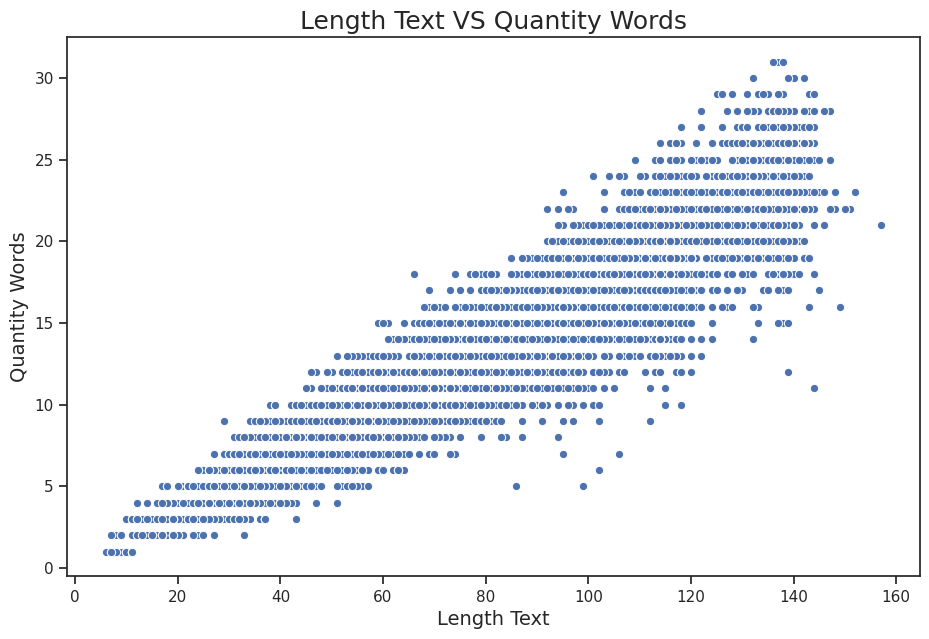

In [769]:
#ScatterPlot longitud del texto vs cantidad de palabras. Seaborn
sns.set(style="ticks")

f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'length_text', y = 'quantity_words', data = train)

ax.set_title('Length Text VS Quantity Words', fontsize = 18)
ax.set_xlabel('Length Text', fontsize = 14)
ax.set_ylabel('Quantity Words', fontsize = 14)

Text(0, 0.5, 'Target')

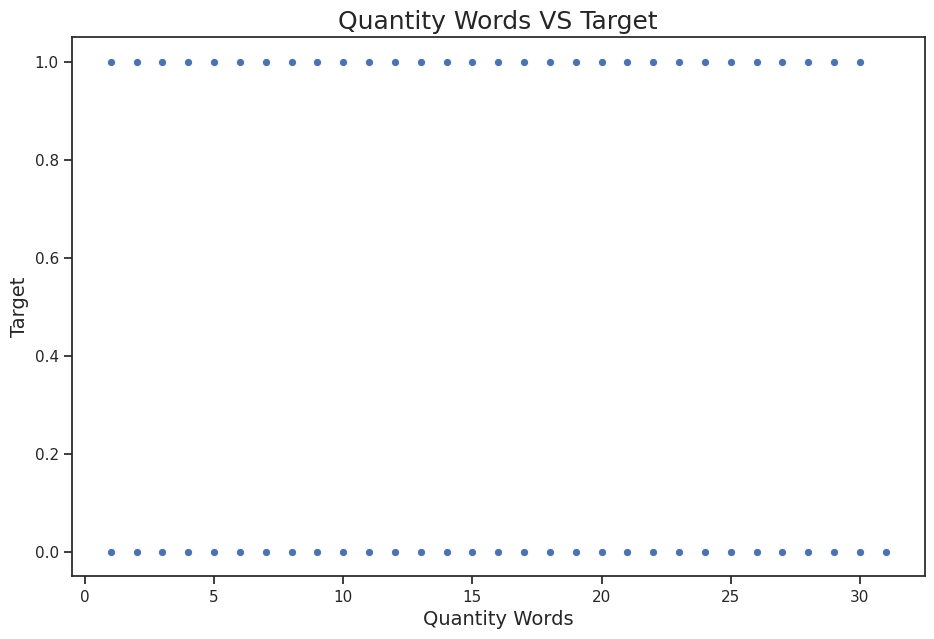

In [770]:
#ScatterPlot cantidad de palabras vs target. Seaborn
sns.set(style="ticks")

f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'quantity_words', y = 'target', data = train)

ax.set_title('Quantity Words VS Target', fontsize = 18)
ax.set_xlabel('Quantity Words', fontsize = 14)
ax.set_ylabel('Target', fontsize = 14)

In [771]:
#Refresco algunas medidas estadísticas
grouped_by_keyword.describe()

,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count,sqr(length_text_mean),length_text_mean^3,length_keyword
count,222.00,222.00,222.00,222.00,222.00,222.00,222.00,222.00
mean,87.39,30.73,34.29,0.43,14.73,"7,755.12","698,095.50",8.48
std,10.89,4.94,5.10,0.27,9.85,"1,886.70","250,835.32",3.01
min,56.05,15.99,9.00,0.00,0.00,"3,142.06","176,125.03",3.00
25%,80.72,28.00,33.00,0.18,6.00,"6,515.49","525,921.56",6.25
50%,88.15,31.08,35.00,0.38,13.00,"7,769.86","684,888.63",8.00
75%,94.97,34.32,37.00,0.67,22.75,"9,019.62","856,608.07",10.00
max,119.09,42.36,61.00,1.00,42.00,"14,182.01","1,688,910.28",19.00


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to c

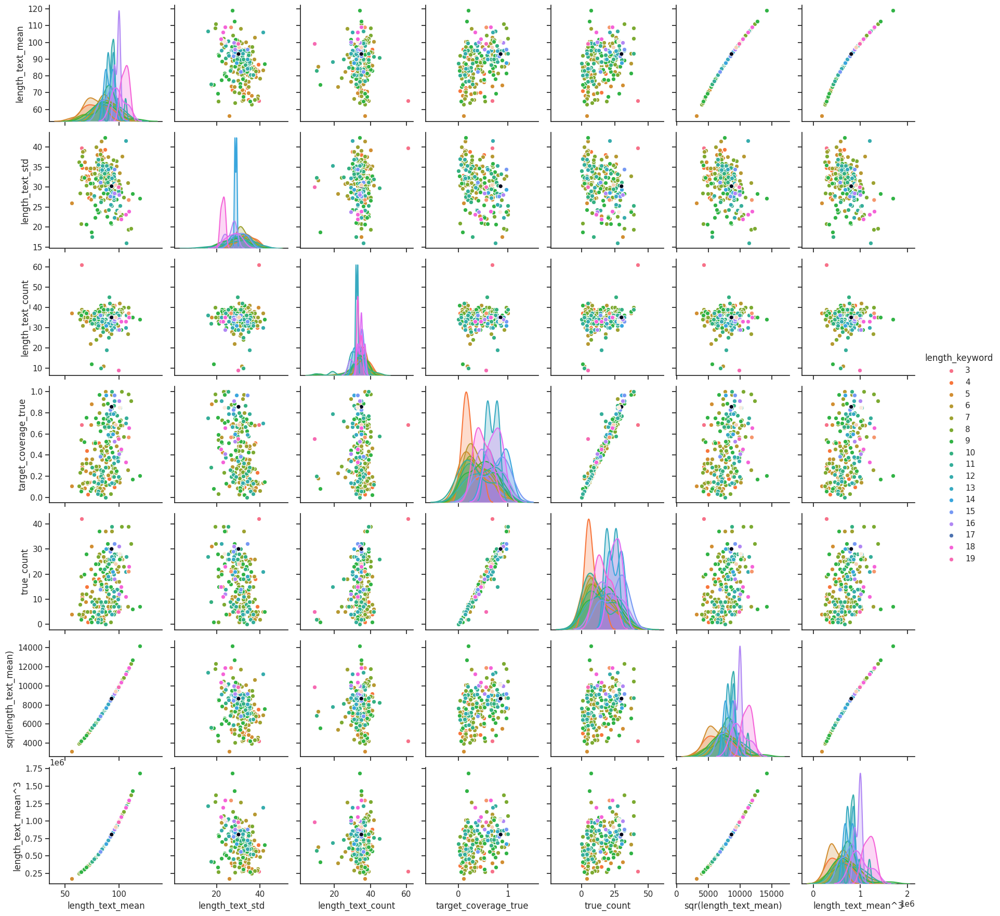

In [772]:
#Otro Pairplot pero con colores segun la longitud de la keyword
sns.set(style="ticks")
sns.pairplot(grouped_by_keyword, hue = 'length_keyword')

In [773]:
#Me quedo con las keyword que tienen una longitud mayor a la longitud media de la keyword
grouped_by_keyword_upper_length_mean = grouped_by_keyword.loc[grouped_by_keyword['length_text_count'] >\
                                                     grouped_by_keyword['length_text_count'].mean(),\
                                                     ['keyword', 'length_text_mean', 'length_text_count', 'target_coverage_true']]
grouped_by_keyword_upper_length_mean.head()

,keyword,length_text_mean,length_text_count,target_coverage_true
0,nan,65.25,61,0.69
1,fatalities,90.89,45,0.58
2,deluge,100.57,42,0.14
3,armageddon,91.40,42,0.12
4,body bags,83.05,41,0.02


In [774]:
#Dataset solo con keyword fatalities
train_keyword_fatalities = train.loc[train['keyword'] == 'fatalities', :]
train_keyword_fatalities.head()

,id,keyword,location,text,target,length_text,length_text_mean_by_keyword,length_text_std_by_keyword,keyword_counts,target_categorico,quantity_words
3646,5162,fatalities,NaN,EXCLUSIVE: In 179 fatalities involving on-duty...,1,81,90.89,29.79,45,True,13
3647,5164,fatalities,New York,#NYC #News Legionnaires death toll rises to 8 ...,1,114,90.89,29.79,45,True,20
3648,5165,fatalities,"New York City ,NY",Let's fraction the vital need for Our fataliti...,0,101,90.89,29.79,45,False,17
3649,5166,fatalities,NaN,Las Vegas in top 5 cities for red-light runnin...,0,69,90.89,29.79,45,False,12
3650,5168,fatalities,"Corpus Christi, Texas",We are totally unprepared for an EMP attack. B...,1,135,90.89,29.79,45,True,23


Text(0, 0.5, 'Target')

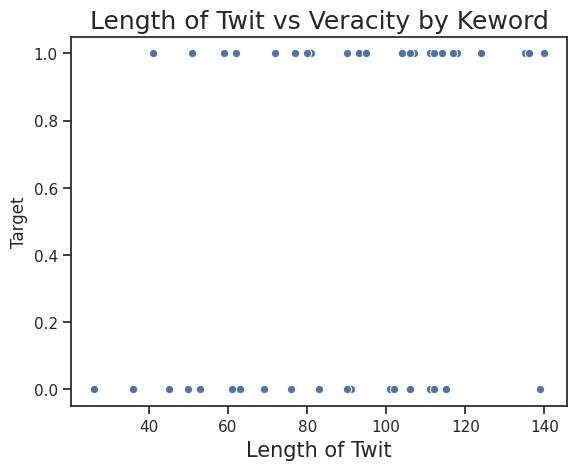

In [775]:
#ScatterPlot longitud del texto vs 1 o 0 (verdadero o falso) para la keyword fatalities
g = sns.scatterplot(x = 'length_text', y = 'target', data = train.loc[(train['keyword'] == 'fatalities'),:])
g.set_title('Length of Twit vs Veracity by Keword', fontsize = 18)
g.set_xlabel('Length of Twit', fontsize = 15)
g.set_ylabel('Target')

Text(0, 0.5, 'Target')

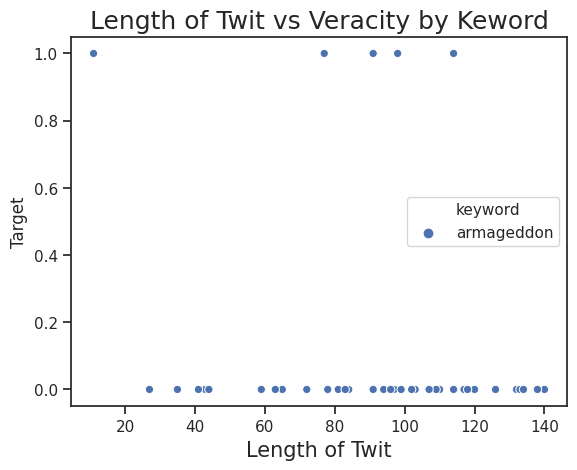

In [776]:
#ScatterPlot longitud del texto vs 1 o 0 (verdadero o falso) para la keyword armageddon
g = sns.scatterplot(x = 'length_text', y = 'target', data = train.loc[(train['keyword'] == 'armageddon'), :], hue = 'keyword')
g.set_title('Length of Twit vs Veracity by Keword', fontsize = 18)
g.set_xlabel('Length of Twit', fontsize = 15)
g.set_ylabel('Target')

Text(0, 0.5, 'Target')

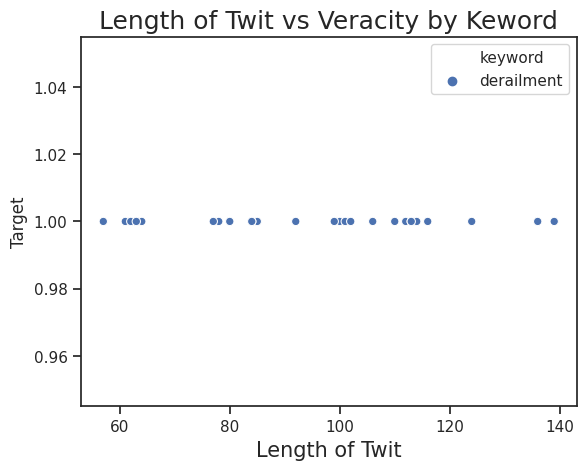

In [777]:
#ScatterPlot longitud del texto vs 1 o 0 (verdadero o falso) para la keyword derailment
g = sns.scatterplot(x = 'length_text', y = 'target', data = train.loc[(train['keyword'] == 'derailment'), :], hue = 'keyword')
g.set_title('Length of Twit vs Veracity by Keword', fontsize = 18)
g.set_xlabel('Length of Twit', fontsize = 15)
g.set_ylabel('Target')